In [ ]:
%matplotlib inline
!pip install contextily
!pip install geopandas
import pandas as pd
import geopandas
import contextily as ctx
from shapely.geometry import Point
import xyzservices.providers as xyz
from google.colab import drive
drive.mount('/content/drive')

1. visualizzi i parchi di Milano e i comuni che vi fanno parte (vedi immagine allegata)

In [2]:
parchi = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/Esercizio 6/Parchi_regionali_e_nazionali_polygon.zip')
parchi

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


In [3]:
com = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/Com01012021_g')
com

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,1001,001001,AgliÃ¨,None,0,16097.848297,1.330696e+07,"POLYGON ((404703.558 5026682.655, 405359.554 5..."
1,1,1,1,201,201,1002,001002,Airasca,None,0,16684.218599,1.595353e+07,"POLYGON ((380700.909 4977305.520, 381105.998 4..."
2,1,1,1,201,201,1003,001003,Ala di Stura,None,0,29892.674582,4.575189e+07,"POLYGON ((364710.857 5022090.678, 364737.794 5..."
3,1,1,1,201,201,1004,001004,Albiano d'Ivrea,None,0,16192.656480,1.103356e+07,"POLYGON ((415942.504 5033304.609, 416079.315 5..."
4,1,1,1,201,201,1006,001006,Almese,None,0,16077.245089,1.771710e+07,"POLYGON ((376934.962 4999073.854, 376960.555 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,5,20,111,0,111,111103,111103,Villaputzu,None,0,100515.537851,1.807260e+08,"MULTIPOLYGON (((556602.772 4375162.650, 556598..."
7899,5,20,111,0,111,111104,111104,Villasalto,None,0,58635.095264,1.303933e+08,"POLYGON ((541186.146 4375105.653, 541180.146 4..."
7900,5,20,111,0,111,111105,111105,Villasimius,None,0,49735.818257,5.759282e+07,"MULTIPOLYGON (((546451.098 4325900.553, 546443..."
7901,5,20,111,0,111,111106,111106,Villasor,None,0,53375.684321,8.640693e+07,"POLYGON ((500362.475 4361229.767, 500397.474 4..."


In [4]:
com.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [5]:
parchi.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [6]:
Milano = com[com.COMUNE=='Milano']
Milano

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1882,1,3,15,215,215,15146,015146,Milano,None,1,79382.994008,1.807534e+08,"POLYGON ((513714.538 5042508.056, 513985.199 5..."


In [7]:
parchi_Milano = parchi[parchi.intersects(Milano.geometry.squeeze())]
parchi_Milano



,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
20,21,Parco Nord Milano,22,5,Parco di cintura metropolitana,2,Parco Regionale,1,Area Regionale,22:Parco Nord Milano,"POLYGON ((516502.662 5041742.040, 516403.321 5..."
21,22,Parco Sud Milano,23,15,Parco agricolo e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,23:Parco Sud Milano,"POLYGON ((533691.079 5042919.602, 533758.703 5..."


In [8]:
Comuni_parchi = com[com.intersects(parchi_Milano.unary_union)]
Comuni_parchi

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1811,1,3,15,215,215,15002,015002,Abbiategrasso,None,0,43048.321516,4.777153e+07,"POLYGON ((493446.898 5029705.643, 493602.897 5..."
1812,1,3,15,215,215,15005,015005,Albairate,None,0,18919.829233,1.567417e+07,"POLYGON ((495595.883 5032525.624, 495661.881 5..."
1815,1,3,15,215,215,15010,015010,Arluno,None,0,18646.960825,1.278364e+07,"POLYGON ((496562.280 5041533.478, 496401.277 5..."
1816,1,3,15,215,215,15011,015011,Assago,None,0,12853.544196,8.397610e+06,"POLYGON ((511386.603 5029333.275, 511518.968 5..."
1817,1,3,15,215,215,15012,015012,Bareggio,None,0,15924.405593,1.130249e+07,"POLYGON ((499326.672 5038880.244, 499885.260 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7465,1,3,98,0,98,98020,098020,Comazzo,None,0,22343.534930,1.277192e+07,"POLYGON ((534210.409 5035224.602, 534551.968 5..."
7484,1,3,98,0,98,98039,098039,Merlino,None,0,18053.583011,1.039029e+07,"POLYGON ((534698.954 5033625.792, 534731.476 5..."
7486,1,3,98,0,98,98041,098041,Mulazzano,None,0,22643.863100,1.529437e+07,"POLYGON ((530678.622 5027337.660, 530960.619 5..."
7500,1,3,98,0,98,98055,098055,Sordio,None,0,6681.722797,2.603890e+06,"POLYGON ((529834.629 5021137.707, 530206.624 5..."


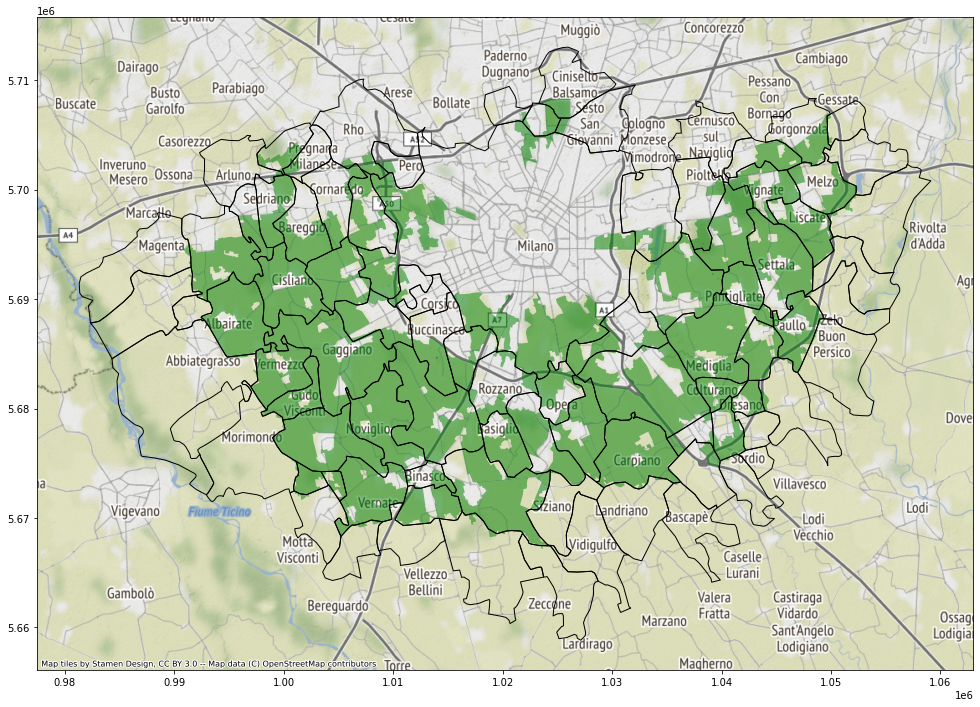

In [ ]:
ax = parchi_Milano.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='green', alpha=0.5)
Comuni_parchi.to_crs(epsg=3857).plot(ax=ax, facecolor='none', edgecolor='k')
ctx.add_basemap(ax)


2. Visualizzare i comuni confinanti con Milano

In [9]:
ComuniConfinanti = com[com.touches(Milano.geometry.squeeze())]
ComuniConfinanti

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1814,1,3,15,215,215,15009,015009,Arese,None,0,14252.406342,6.317493e+06,"POLYGON ((506416.116 5045124.529, 506782.458 5..."
1816,1,3,15,215,215,15011,015011,Assago,None,0,12853.544196,8.397610e+06,"POLYGON ((511386.603 5029333.275, 511518.968 5..."
1825,1,3,15,215,215,15027,015027,Bollate,None,0,19203.626038,1.289232e+07,"POLYGON ((508068.588 5045562.067, 508068.588 5..."
1826,1,3,15,215,215,15032,015032,Bresso,None,0,7156.575704,3.541098e+06,"POLYGON ((514613.122 5043643.623, 515033.668 5..."
1828,1,3,15,215,215,15036,015036,Buccinasco,None,0,18782.927234,1.197888e+07,"POLYGON ((509908.110 5030714.300, 510291.086 5..."
1846,1,3,15,215,215,15074,015074,Cesano Boscone,None,0,11732.421451,3.955227e+06,"POLYGON ((506991.974 5033297.204, 507033.799 5..."
1850,1,3,15,215,215,15081,015081,Cologno Monzese,None,0,13728.742127,8.300571e+06,"POLYGON ((521178.812 5044037.362, 521198.630 5..."
1853,1,3,15,215,215,15086,015086,Cormano,None,0,9385.424982,4.543172e+06,"POLYGON ((513324.450 5044373.750, 513413.918 5..."
1855,1,3,15,215,215,15093,015093,Corsico,None,0,13378.408354,4.671315e+06,"POLYGON ((508715.786 5032711.622, 508754.073 5..."
1857,1,3,15,215,215,15097,015097,Cusago,None,0,15712.454369,1.156919e+07,"POLYGON ((502905.966 5034740.413, 503349.392 5..."


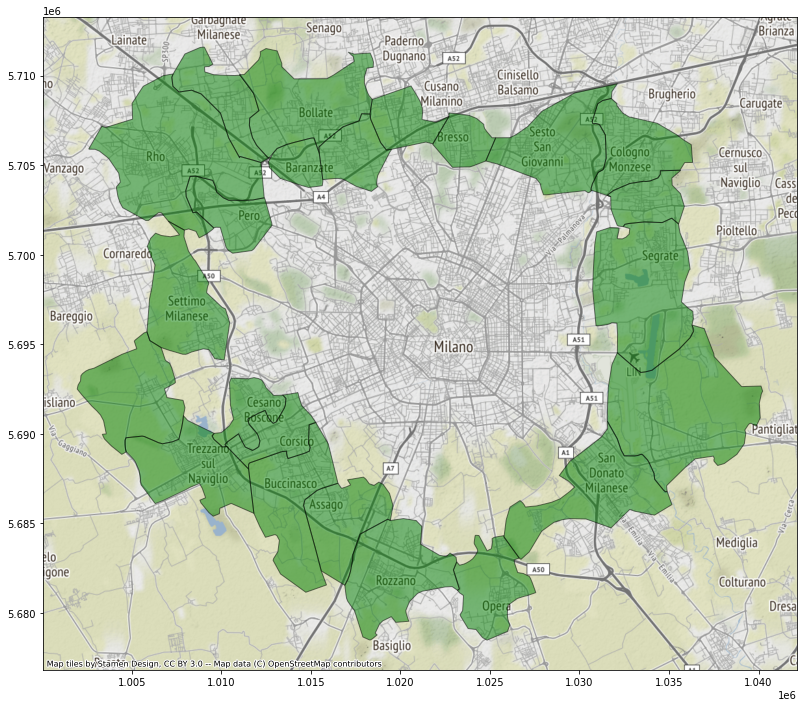

In [10]:
ax = ComuniConfinanti.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='green', alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

In [11]:
ComuniConfinantiConfinanti = com[com.touches(ComuniConfinanti.unary_union)]
ComuniConfinanti

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1814,1,3,15,215,215,15009,015009,Arese,None,0,14252.406342,6.317493e+06,"POLYGON ((506416.116 5045124.529, 506782.458 5..."
1816,1,3,15,215,215,15011,015011,Assago,None,0,12853.544196,8.397610e+06,"POLYGON ((511386.603 5029333.275, 511518.968 5..."
1825,1,3,15,215,215,15027,015027,Bollate,None,0,19203.626038,1.289232e+07,"POLYGON ((508068.588 5045562.067, 508068.588 5..."
1826,1,3,15,215,215,15032,015032,Bresso,None,0,7156.575704,3.541098e+06,"POLYGON ((514613.122 5043643.623, 515033.668 5..."
1828,1,3,15,215,215,15036,015036,Buccinasco,None,0,18782.927234,1.197888e+07,"POLYGON ((509908.110 5030714.300, 510291.086 5..."
1846,1,3,15,215,215,15074,015074,Cesano Boscone,None,0,11732.421451,3.955227e+06,"POLYGON ((506991.974 5033297.204, 507033.799 5..."
1850,1,3,15,215,215,15081,015081,Cologno Monzese,None,0,13728.742127,8.300571e+06,"POLYGON ((521178.812 5044037.362, 521198.630 5..."
1853,1,3,15,215,215,15086,015086,Cormano,None,0,9385.424982,4.543172e+06,"POLYGON ((513324.450 5044373.750, 513413.918 5..."
1855,1,3,15,215,215,15093,015093,Corsico,None,0,13378.408354,4.671315e+06,"POLYGON ((508715.786 5032711.622, 508754.073 5..."
1857,1,3,15,215,215,15097,015097,Cusago,None,0,15712.454369,1.156919e+07,"POLYGON ((502905.966 5034740.413, 503349.392 5..."


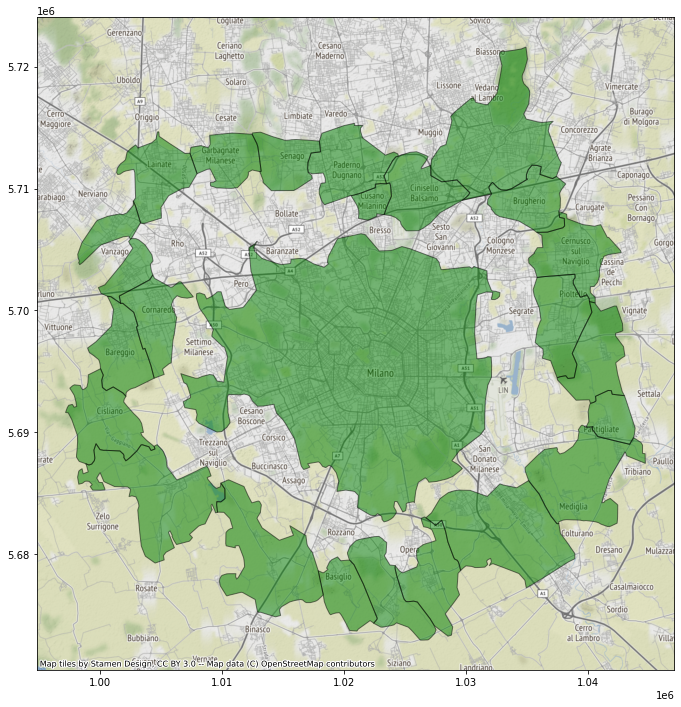

In [12]:
ax = ComuniConfinantiConfinanti.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='green', alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

3. Visualizzare il più grande comune confinante con Milano 

In [13]:
ComunePiuGrande = ComuniConfinanti[ComuniConfinanti.Shape_Area==ComuniConfinanti.Shape_Area.max()]
ComunePiuGrande

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1897,1,3,15,215,215,15171,015171,Peschiera Borromeo,None,0,22044.433303,2.240204e+07,"POLYGON ((524640.471 5035256.833, 525021.665 5..."


Visualizzare il più piccolo comune confinante con Milano 

In [14]:
ComunePiuPiccolo = ComuniConfinanti[ComuniConfinanti.Shape_Area==ComuniConfinanti.Shape_Area.min()]
ComunePiuPiccolo

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1942,1,3,15,215,215,15250,015250,Baranzate,None,0,6567.963947,2.944838e+06,"POLYGON ((509363.172 5042554.492, 509538.293 5..."


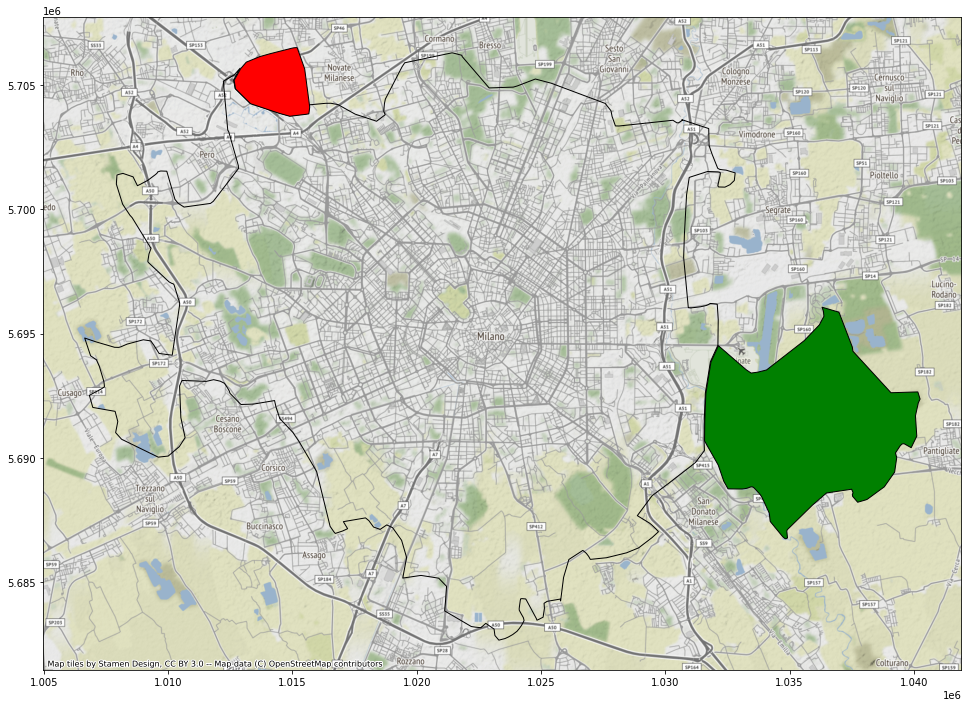

In [15]:
ax = Milano.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='none', edgecolor='k')
ComunePiuGrande.to_crs(epsg=3857).plot(facecolor='green', edgecolor='k', ax=ax)
ComunePiuPiccolo.to_crs(epsg=3857).plot(facecolor='red', edgecolor='k', ax=ax)
ctx.add_basemap(ax)

2. analogo al primo esercizio ma tracciando sulla mappa solo i quartieri di Milano attraversati da parchi (e non tutta la città)

In [16]:
quartieri_milano = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/Geopandas esercizio 3/ds964_nil_wm.zip')
quartieri_milano

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
2,67,PORTELLO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3800.750663,9.096022e+05,91,"POLYGON ((9.15636 45.48785, 9.15724 45.48721, ..."
3,81,BOVISASCA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7105.469715,1.578028e+06,92,"POLYGON ((9.16803 45.52234, 9.16687 45.52027, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
...,...,...,...,...,...,...,...,...,...
83,68,PAGANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5221.836696,1.289686e+06,172,"POLYGON ((9.17174 45.47619, 9.17150 45.47595, ..."
84,2,BRERA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5461.667196,1.637333e+06,173,"POLYGON ((9.19165 45.46906, 9.19105 45.46843, ..."
85,33,ROGOREDO - SANTA GIULIA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6012.496435,1.200116e+06,174,"POLYGON ((9.24044 45.44427, 9.24084 45.44424, ..."
86,17,ADRIANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,9276.875747,2.433358e+06,175,"POLYGON ((9.26729 45.51234, 9.26701 45.51241, ..."


In [17]:
quartieri_parchi = quartieri_milano[quartieri_milano.intersects(parchi.to_crs(epsg=4326).geometry.unary_union)]
quartieri_parchi

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((9.08375 45.48485, 9.08280 45.48521, ..."
9,61,QUARTO CAGNINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,4648.169991,9.863542e+05,98,"POLYGON ((9.11143 45.47640, 9.11193 45.47624, ..."
10,60,STADIO - IPPODROMI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8277.734101,3.435178e+06,99,"POLYGON ((9.13020 45.48464, 9.13075 45.48449, ..."
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((9.08375 45.48485, 9.08444 45.48459, ..."
20,83,BRUZZANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6441.288643,1.670440e+06,109,"POLYGON ((9.17808 45.53479, 9.17807 45.53439, ..."
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((9.16112 45.42589, 9.16270 45.42544, ..."
24,39,QUINTOSOLE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6740.830821,1.058525e+06,113,"POLYGON ((9.21047 45.39699, 9.21039 45.39698, ..."


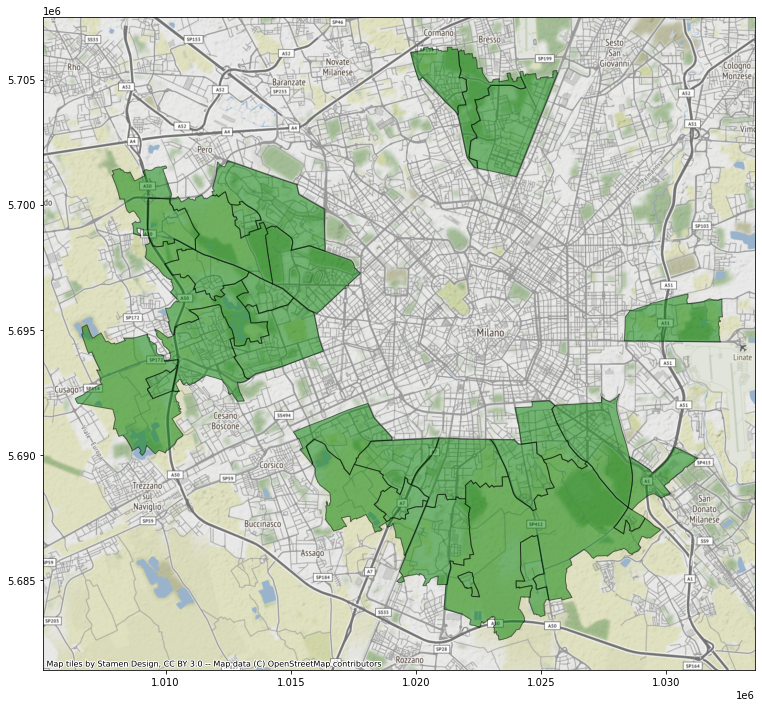

In [18]:
quartieri_parchi = quartieri_milano[quartieri_milano.intersects(parchi.to_crs(epsg=4326).geometry.unary_union)]
ax = quartieri_parchi.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='green', edgecolor='k', alpha=0.5)
ctx.add_basemap(ax)

3.  dato il nome di un parco, avere la mappa del parco con i comuni che lo ospitano

In [19]:
com.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Inserire il nome di un parco: Parco Nord Milano


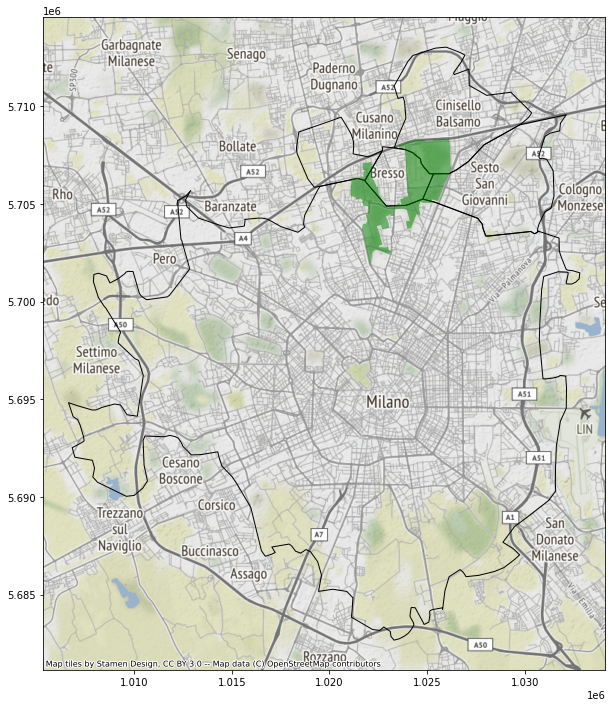

In [20]:
user = input('Inserire il nome di un parco: ')
lst = list(parchi['NOME'])
if user not in lst:
  print('Il Parco inserito non è in Lombardia')
else: 
  parco = parchi[parchi.NOME==user].to_crs(epsg=32632)
  comuni = com[com.intersects(parco.geometry.squeeze())]
  ax = comuni.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='none', edgecolor='k')
  parco.to_crs(epsg=3857).plot(ax=ax, facecolor='green', alpha=0.5)
  ctx.add_basemap(ax)

4. dato il nome di un parco, avere la mappa del parco con le province che attraversa

In [21]:
prov = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/ProvCM01012021_g')
prov

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,-,Torino,Torino,TO,Citta metropolitana,539249.811270,6.828137e+09,"POLYGON ((411015.006 5049970.983, 411266.039 5..."
1,1,1,2,0,2,Vercelli,-,Vercelli,VC,Provincia,418078.067821,2.082097e+09,"POLYGON ((438328.612 5087208.215, 439028.888 5..."
2,1,1,3,0,3,Novara,-,Novara,NO,Provincia,250242.112077,1.341318e+09,"POLYGON ((460929.542 5076320.298, 461165.259 5..."
3,1,1,4,0,4,Cuneo,-,Cuneo,CN,Provincia,490111.881318,6.898443e+09,"MULTIPOLYGON (((378673.492 4958865.159, 378928..."
4,1,1,5,0,5,Asti,-,Asti,AT,Provincia,315563.261771,1.508947e+09,"POLYGON ((425041.329 4997628.309, 424948.989 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,1,1,103,0,103,Verbano-Cusio-Ossola,-,Verbano-Cusio-Ossola,VB,Provincia,299029.117691,2.262164e+09,"POLYGON ((457749.464 5145501.795, 458662.395 5..."
103,1,3,108,0,108,Monza e della Brianza,-,Monza e della Brianza,MB,Provincia,126272.490811,4.055793e+08,"POLYGON ((519754.706 5065242.380, 520199.702 5..."
104,3,11,109,0,109,Fermo,-,Fermo,FM,Provincia,198635.321418,8.619365e+08,"POLYGON ((884760.019 4804406.440, 885511.011 4..."
105,4,16,110,0,110,Barletta-Andria-Trani,-,Barletta-Andria-Trani,BT,Provincia,237762.889058,1.542032e+09,"POLYGON ((1081237.144 4611047.023, 1081399.393..."


Inserire il nome di un parco: Parco Nord Milano


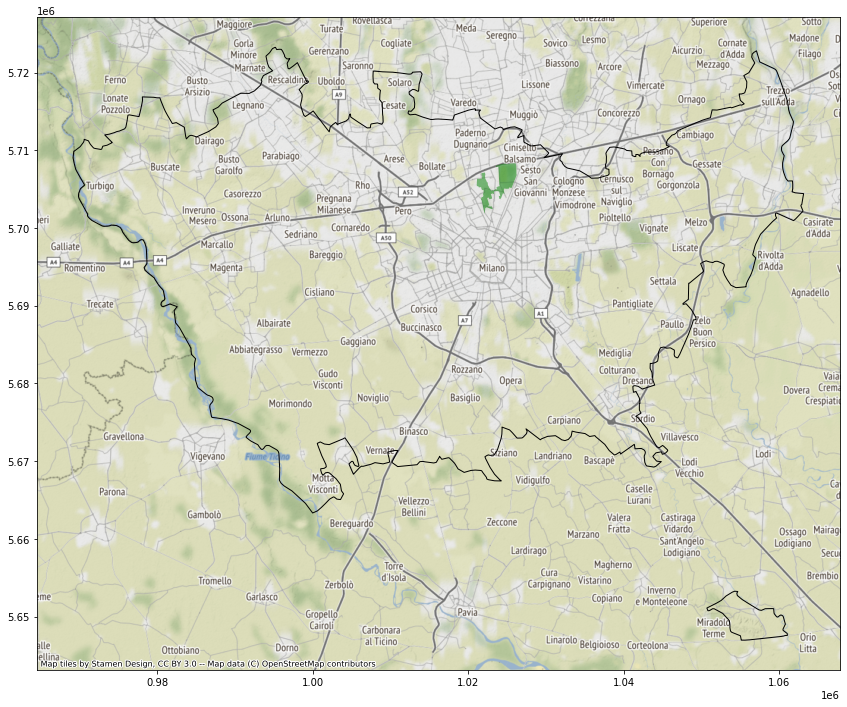

In [23]:
user = input('Inserire il nome di un parco: ')
lst = list(parchi['NOME'])
if user not in lst:
  print('Il Parco inserito non è in Lombardia')
else: 
  parco = parchi[parchi.NOME==user].to_crs(epsg=32632)
  comuni = prov[prov.intersects(parco.geometry.squeeze())]
  ax = comuni.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='none', edgecolor='k')
  parco.to_crs(epsg=3857).plot(ax=ax, facecolor='green', alpha=0.5)
  ctx.add_basemap(ax)

5. dato un comune, avere i parchi che ospita (elenco e mappa)

In [24]:
regioni = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/Reg01012021_g')
regioni

,COD_RIP,COD_REG,DEN_REG,Shape_Leng,Shape_Area,geometry
0,1,1,Piemonte,1.235512e+06,2.539390e+10,"POLYGON ((457749.464 5145501.795, 458662.395 5..."
1,1,2,Valle d'Aosta,3.109681e+05,3.258838e+09,"POLYGON ((390652.644 5091766.171, 390748.643 5..."
2,1,3,Lombardia,1.410223e+06,2.386232e+10,"MULTIPOLYGON (((485536.366 4985444.605, 485366..."
3,2,4,Trentino-Alto Adige,8.008937e+05,1.360755e+10,"POLYGON ((743267.749 5219765.793, 743387.812 5..."
4,2,5,Veneto,1.054587e+06,1.834355e+10,"POLYGON ((768123.960 5175397.497, 768135.210 5..."
5,2,6,Friuli Venezia Giulia,6.700448e+05,7.933911e+09,"MULTIPOLYGON (((872344.457 5061894.048, 872344..."
6,1,7,Liguria,8.205420e+05,5.414612e+09,"MULTIPOLYGON (((568226.691 4874823.573, 568219..."
7,2,8,Emilia-Romagna,1.176188e+06,2.244275e+10,"MULTIPOLYGON (((618343.929 4893985.661, 618335..."
8,3,9,Toscana,1.306596e+06,2.298352e+10,"MULTIPOLYGON (((674426.642 4680710.364, 674563..."
9,3,10,Umbria,6.197684e+05,8.464380e+09,"MULTIPOLYGON (((776982.140 4832209.918, 776910..."


In [25]:
Lombardia = regioni[regioni.DEN_REG=='Lombardia']
Lombardia

,COD_RIP,COD_REG,DEN_REG,Shape_Leng,Shape_Area,geometry
2,1,3,Lombardia,1.410223e+06,2.386232e+10,"MULTIPOLYGON (((485536.366 4985444.605, 485366..."


In [26]:
ComuniLombardia=com[com.within(Lombardia.geometry.squeeze())]
ComuniLombardia

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1448,1,3,12,0,12,12001,012001,Agra,None,0,6996.108320,2.942389e+06,"POLYGON ((482802.662 5097733.142, 482784.662 5..."
1449,1,3,12,0,12,12002,012002,Albizzate,None,0,9255.748026,3.813831e+06,"POLYGON ((485235.221 5064709.066, 485545.361 5..."
1450,1,3,12,0,12,12003,012003,Angera,None,0,24194.847570,1.748219e+07,"POLYGON ((470218.756 5071198.335, 470937.656 5..."
1451,1,3,12,0,12,12004,012004,Arcisate,None,0,19072.979574,1.229388e+07,"POLYGON ((488207.686 5080963.765, 488368.654 5..."
1452,1,3,12,0,12,12005,012005,Arsago Seprio,None,0,15318.402658,1.053346e+07,"POLYGON ((478637.631 5063107.396, 478750.600 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7741,1,3,108,0,108,108051,108051,Busnago,None,0,11376.029586,5.834750e+06,"POLYGON ((535742.586 5052473.474, 535839.585 5..."
7742,1,3,108,0,108,108052,108052,Caponago,None,0,11874.711735,4.807794e+06,"POLYGON ((530927.622 5047008.514, 530890.358 5..."
7743,1,3,108,0,108,108053,108053,Cornate d'Adda,None,0,15414.910444,1.364665e+07,"POLYGON ((537678.573 5057235.438, 537951.570 5..."
7744,1,3,108,0,108,108054,108054,Lentate sul Seveso,None,0,17060.616570,1.431746e+07,"POLYGON ((508523.788 5059797.421, 509626.779 5..."


Inserire un comune:Cormano
20    Parco Nord Milano
Name: NOME, dtype: object


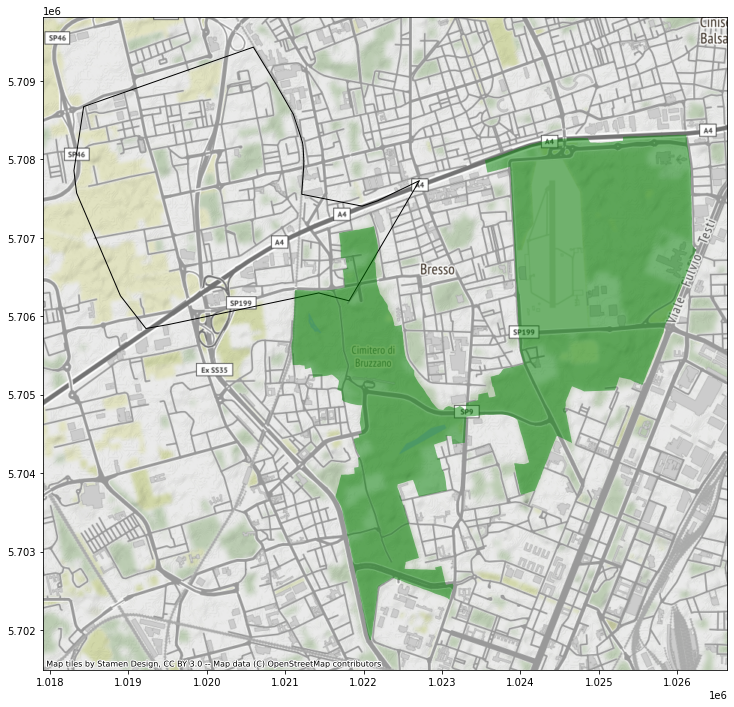

In [27]:
user = input('Inserire un comune:')
lst = list(ComuniLombardia['COMUNE'])
if user not in lst:
  print('Il Comune inserito non è in Lombardia')
else: 
  parchiComune = parchi[parchi.intersects(com[com.COMUNE.str.contains(user)].geometry.squeeze())]
  comuni = com[com.COMUNE==user].to_crs(epsg=32632)
  parco = parchi[parchi.intersects(comuni.geometry.squeeze())]
  ax = comuni.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='none', edgecolor='k')
  parco.to_crs(epsg=3857).plot(ax=ax, facecolor='green', alpha=0.5)
  ctx.add_basemap(ax)
  print(parchiComune.NOME)

6. dato il nome di una provincia, avere i parchi che ospita (elenco e mappa)

In [28]:
ProvinceLombardia=prov[prov.within(Lombardia.geometry.squeeze())]
ProvinceLombardia

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
11,1,3,12,0,12,Varese,-,Varese,VA,Provincia,246016.658456,1.199334e+09,"POLYGON ((483071.566 5104606.092, 483258.471 5..."
12,1,3,13,0,13,Como,-,Como,CO,Provincia,260565.230534,1.279301e+09,"MULTIPOLYGON (((498077.207 5089780.202, 497614..."
13,1,3,14,0,14,Sondrio,-,Sondrio,SO,Provincia,464265.098278,3.194949e+09,"POLYGON ((595652.358 5163515.659, 596042.420 5..."
14,1,3,15,215,215,-,Milano,Milano,MI,Citta metropolitana,309951.219188,1.575033e+09,"MULTIPOLYGON (((538136.289 5004372.814, 539162..."
15,1,3,16,0,16,Bergamo,-,Bergamo,BG,Provincia,310847.260446,2.754672e+09,"POLYGON ((585288.233 5104483.085, 585414.669 5..."
16,1,3,17,0,17,Brescia,-,Brescia,BS,Provincia,446387.375203,4.787545e+09,"POLYGON ((615296.024 5132340.876, 615374.024 5..."
17,1,3,18,0,18,Pavia,-,Pavia,PV,Provincia,449504.645144,2.967086e+09,"MULTIPOLYGON (((485536.366 4985444.605, 485366..."
18,1,3,19,0,19,Cremona,-,Cremona,CR,Provincia,365500.445250,1.769382e+09,"POLYGON ((542189.537 5037362.585, 542408.347 5..."
19,1,3,20,0,20,Mantova,-,Mantova,MN,Provincia,386685.850910,2.341796e+09,"POLYGON ((630538.958 5031669.589, 632819.864 5..."
96,1,3,97,0,97,Lecco,-,Lecco,LC,Provincia,181294.401343,8.056511e+08,"POLYGON ((532079.618 5104664.092, 533286.608 5..."


Inserire una provincia:Bergamo
0     Parco Alpi Orobie Valtellinesi
1      Parco Alpi Orobie Bergamasche
8                    Parco Adda Nord
12             Parco dell'Oglio Nord
13        Parco dei Colli di Bergamo
19                   Parco del Serio
22                    Parco Adda Sud
Name: NOME, dtype: object


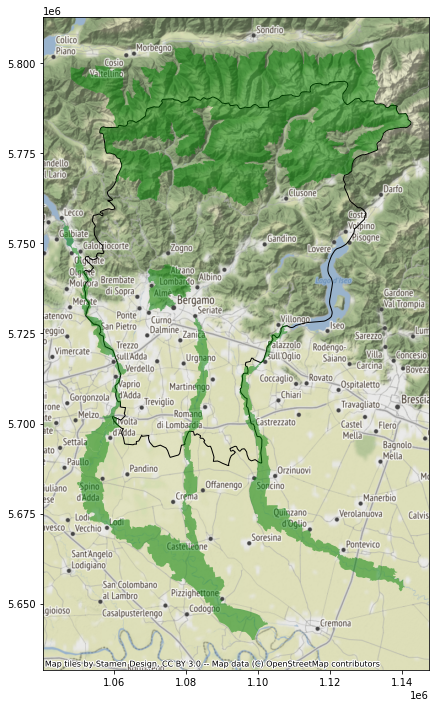

In [29]:
user = input('Inserire una provincia:')
lst = list(ProvinceLombardia['DEN_UTS'])
if user not in lst:
  print('La Provincia inserita non è in Lombardia')
else: 
  parchiProvincia = parchi[parchi.intersects(prov[prov.DEN_UTS.str.contains(user)].geometry.squeeze())]
  province = prov[prov.DEN_UTS==user].to_crs(epsg=32632)
  parco = parchi[parchi.intersects(province.geometry.squeeze())]
  ax = province.to_crs(epsg=3857).plot(figsize=(20,12), facecolor='none', edgecolor='k')
  parco.to_crs(epsg=3857).plot(ax=ax, facecolor='green', alpha=0.5)
  ctx.add_basemap(ax)
  print(parchiProvincia.NOME)